In [1]:
import sys
from paths import PathFinder
from sahi import AutoDetectionModel

from ultralytics import YOLO
from utils.optimizer import predict_sahi

PATHS = PathFinder()
sys.path.insert(0, PATHS["LIB_PYNICHE"].as_posix())
from pyniche.data.yolo.API import YOLO_API
from pyniche.visualization.supervision import annotate_detection

Successfully loaded /home/niche/finding_ants/.env
Available project environments: 
    DIR_iNATURALIST=/projects/niche_squad/finding-ants/inaturalist
    DIR_DATA=/projects/niche_squad/finding-ants
    DIR_DATA_FINAL=/projects/niche_squad/finding-ants/final
    DIR_DATA_ROBO=/projects/niche_squad/finding-ants/roboflow
    DIR_DATA_YOLO=/projects/niche_squad/finding-ants/yolo
    DIR_SRC=/home/niche/finding_ants
    DIR_DATA_RAW=/projects/niche_squad/finding-ants/processed
Successfully loaded /home/niche/finding_ants/.env
Available project environments: 
    DIR_iNATURALIST=/projects/niche_squad/finding-ants/inaturalist
    DIR_DATA=/projects/niche_squad/finding-ants
    DIR_DATA_FINAL=/projects/niche_squad/finding-ants/final
    DIR_DATA_ROBO=/projects/niche_squad/finding-ants/roboflow
    DIR_DATA_YOLO=/projects/niche_squad/finding-ants/yolo
    DIR_SRC=/home/niche/finding_ants
    DIR_DATA_RAW=/projects/niche_squad/finding-ants/processed


In [2]:
model_a = AutoDetectionModel.from_pretrained(
    model_type="ultralytics", 
    model_path="out/study2/thread_0/yolo11n_1_NOFT/iter_98/weights/best.pt",
    confidence_threshold=0.3,)
model_bc = AutoDetectionModel.from_pretrained(
    model_type="ultralytics", 
    model_path="out/study2/thread_0/yolo11n_2_FT/iter_98/weights/best.pt",
    confidence_threshold=0.3,)
data = YOLO_API(PATHS["DIR_DATA"] / "study2")
data_dense = data["test_dense"]
data_inat = data["test_inat"]

Loaded 1438 images from /projects/niche_squad/finding-ants/study2/train_9
Loaded 59 images from /projects/niche_squad/finding-ants/study2/test_2
Loaded 106 images from /projects/niche_squad/finding-ants/study2/val_7
Loaded 1597 images from /projects/niche_squad/finding-ants/study2/train_7
Loaded 106 images from /projects/niche_squad/finding-ants/study2/train_dense_4
Loaded 106 images from /projects/niche_squad/finding-ants/study2/train_dense_7
Loaded 106 images from /projects/niche_squad/finding-ants/study2/val_dense_2
Loaded 59 images from /projects/niche_squad/finding-ants/study2/test_0
Loaded 1438 images from /projects/niche_squad/finding-ants/study2/train_5
Loaded 106 images from /projects/niche_squad/finding-ants/study2/val_dense_8
Loaded 106 images from /projects/niche_squad/finding-ants/study2/val_4
Loaded 59 images from /projects/niche_squad/finding-ants/study2/test_8
Loaded 60 images from /projects/niche_squad/finding-ants/study2/test_dense
Loaded 106 images from /projects/nic

In [5]:
pil_dense = data_dense.get_PIL(5)

In [62]:
import time
import numpy as np
time_base = []
time_good = []
for i in range(10):
    start = time.time()
    pred_base = predict_sahi(
        pil_dense,
        model_a,
        no_slice=True,
    )
    time_base += [time.time() - start]

    start = time.time()
    pred_good = predict_sahi(
        pil_dense,
        model_bc,
        divider=4, overlap=0,
    )
    time_good += [time.time() - start]

print(f"Base model time: {np.mean(time_base):.3f} ± {np.std(time_base):.3f} seconds")
print(f"Good model time: {np.mean(time_good):.3f} ± {np.std(time_good):.3f} seconds")


Base model time: 0.146 ± 0.018 seconds
Good model time: 3.644 ± 0.026 seconds


In [3]:
import supervision as sv
param_vis = {
    "box_color": sv.Color.BLUE,
    "box_thickness": 2,
}


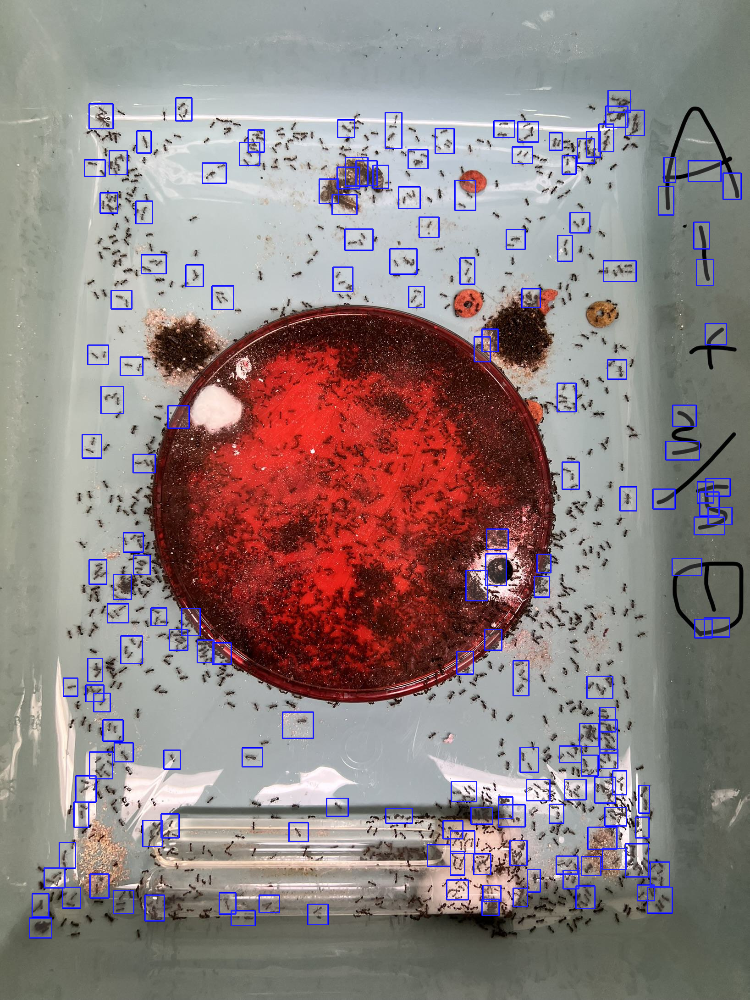

In [6]:
pred_base = predict_sahi(
    pil_dense,
    model_a,
    no_slice=True,
)
img_base = annotate_detection(
    pil_dense,
    pred_base,
    **param_vis
)
img_base

In [6]:
pred_good = predict_sahi(
        pil_dense,
        model_bc,
        divider=4, overlap=0,
    )
img_good = annotate_detection(
    pil_dense,
    pred_good,
    **param_vis
)
img_good

KeyboardInterrupt: 

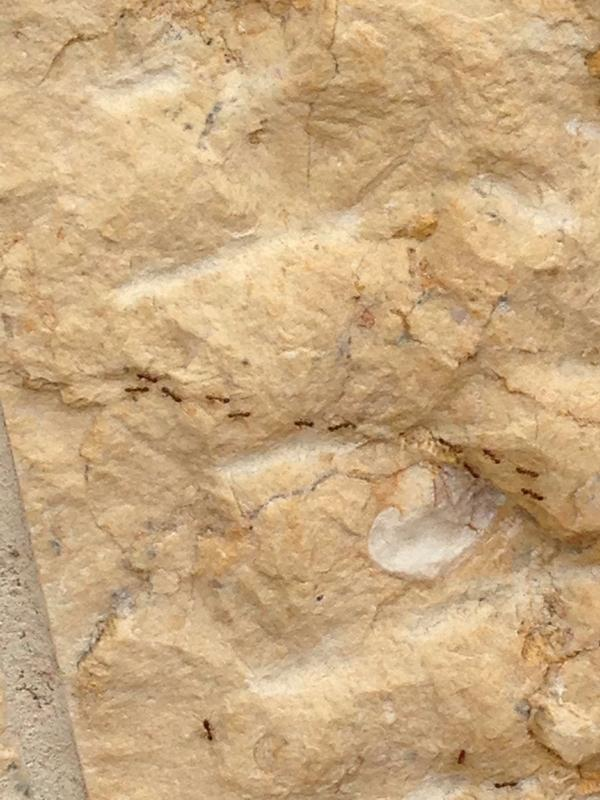

In [51]:
data_inat.get_PIL(7)

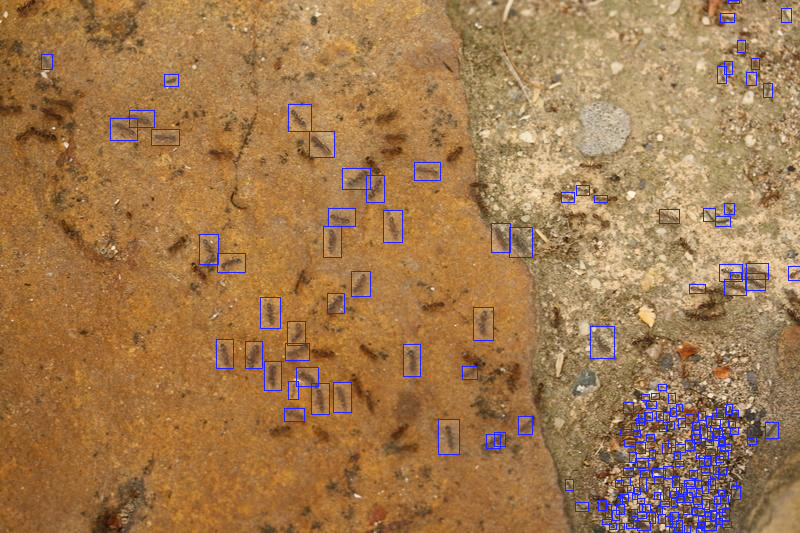

In [69]:
pil = data_inat.get_PIL(4)
pred = predict_sahi(pil, model_a, divider=2, overlap=0)
annotate_detection(pil, pred, **param_vis)

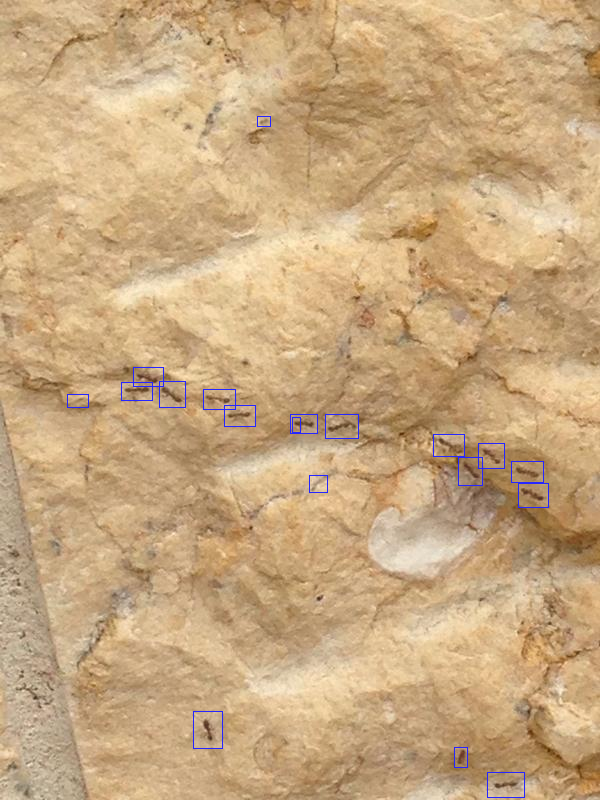

In [53]:
pil = data_inat.get_PIL(7)
pred = predict_sahi(pil, model_a, divider=2, overlap=0)
annotate_detection(pil, pred, **param_vis)

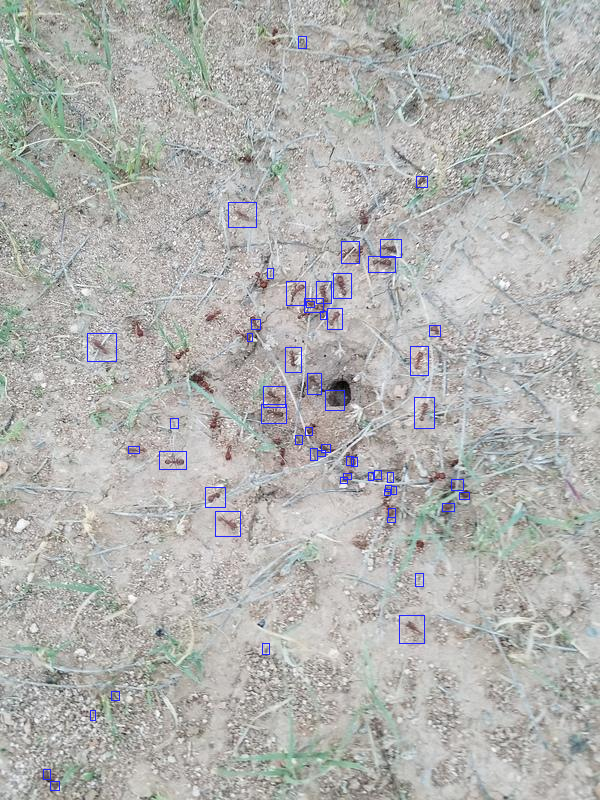

In [ ]:
pil = data_inat.get_PIL(15)
pred = predict_sahi(pil, model_a, divider=3, overlap=0)
annotate_detection(pil, pred, **param_vis)

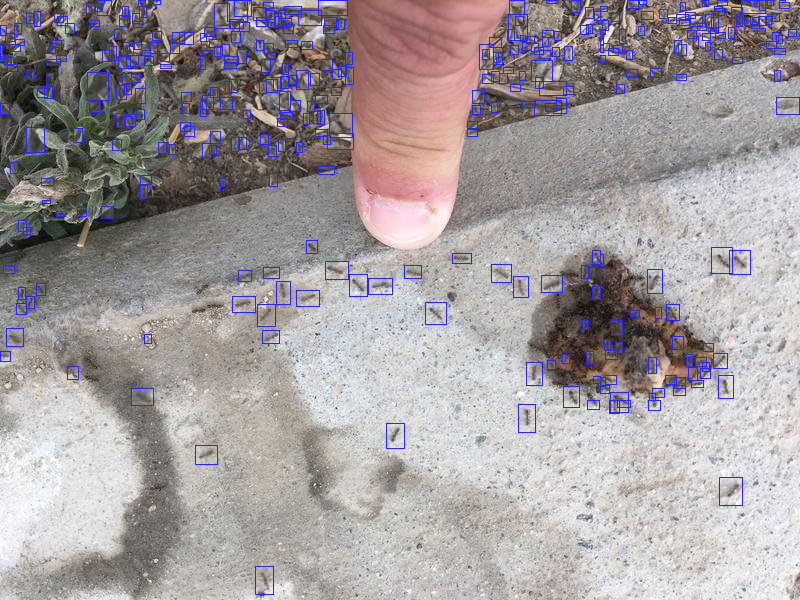

In [58]:
pil = data_inat.get_PIL(17)
pred = predict_sahi(pil, model_a, divider=3, overlap=0)
annotate_detection(pil, pred, **param_vis)

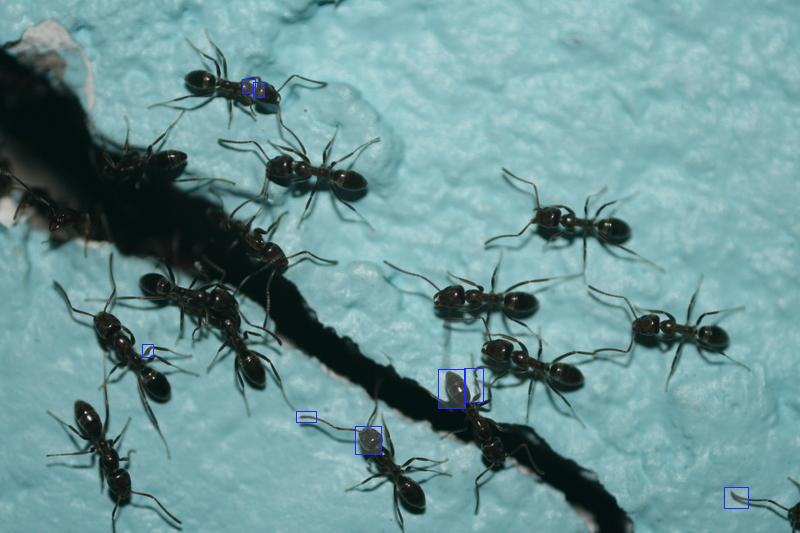

In [59]:
pil = data_inat.get_PIL(18)
pred = predict_sahi(pil, model_a, divider=2, overlap=0)
annotate_detection(pil, pred, **param_vis)

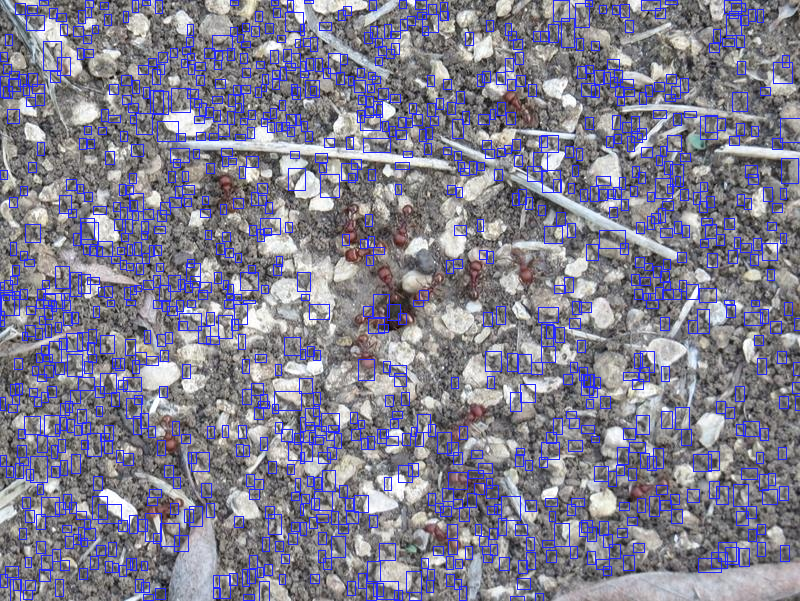

In [60]:
pil = data_inat.get_PIL(19)
pred = predict_sahi(pil, model_a, divider=2, overlap=0)
annotate_detection(pil, pred, **param_vis)

## Chart for the desne dataset

In [75]:
pils = data_dense.get_PILs()
preds = predict_sahi(
    pils,
    model_bc,
    divider=4, overlap=0,
)

In [ ]:
filenames = [p.name for p in data_dense.images]
count_preds = [len(pred) for pred in preds]
df_pred = pd.DataFrame({
    "filename": filenames,
    "pre": count_preds,
})
df_pred

,filename,pre
0,t1-A1_1.JPEG,1560
1,t1-A1_10.JPEG,671
2,t1-A1_11.JPEG,1628
3,t1-A1_12.JPEG,1640
4,t1-A1_13.JPEG,1653
5,t1-A1_14.JPEG,1453
6,t1-A1_15.JPEG,1912
7,t1-A1_16.JPEG,1667
8,t1-A1_17.JPEG,2044
9,t1-A1_18.JPEG,2090


In [72]:
import pandas as pd
s2_obs = pd.read_csv("out/s2_true.csv").dropna()
s2_obs

,filename,trt,date,time,obs
0,t1-A1_1.JPEG,virus,2023-02-28,05:00,1063.0
2,t1-A1_3.JPEG,virus,2023-03-02,17:00,1157.0
4,t1-A1_5.JPEG,virus,2023-03-04,05:00,1186.0
6,t1-A1_7.JPEG,virus,2023-03-06,17:00,967.0
7,t1-A1_8.JPEG,virus,2023-03-07,05:00,399.0
8,t1-A1_9.JPEG,virus,2023-03-08,17:00,1342.0
9,t1-A1_10.JPEG,virus,2023-03-09,05:00,386.0
10,t1-A1_11.JPEG,virus,2023-03-10,17:00,1163.0
11,t1-A1_12.JPEG,virus,2023-03-11,05:00,1188.0
12,t1-A1_13.JPEG,virus,2023-03-12,17:00,1176.0


In [100]:
df_s2 = pd.merge(
    df_pred,
    s2_obs,
    on="filename",
    how="left",).dropna()
df_s2.to_csv("out/s2_dense_vis.csv", index=False)
df_s2

,filename,pre,trt,date,time,obs
0,t1-A1_1.JPEG,1560,virus,2023-02-28,05:00,1063.0
1,t1-A1_10.JPEG,671,virus,2023-03-09,05:00,386.0
2,t1-A1_11.JPEG,1628,virus,2023-03-10,17:00,1163.0
3,t1-A1_12.JPEG,1640,virus,2023-03-11,05:00,1188.0
4,t1-A1_13.JPEG,1653,virus,2023-03-12,17:00,1176.0
5,t1-A1_14.JPEG,1453,virus,2023-03-13,05:00,956.0
6,t1-A1_15.JPEG,1912,virus,2023-03-14,17:00,1370.0
7,t1-A1_16.JPEG,1667,virus,2023-03-15,05:00,1273.0
8,t1-A1_17.JPEG,2044,virus,2023-03-16,17:00,1523.0
9,t1-A1_18.JPEG,2090,virus,2023-03-17,05:00,1686.0


Correlation r: 0.969, RMSE: 418.644, RMSPE: 176.716


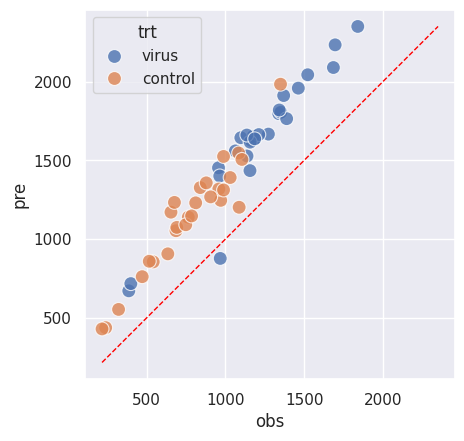

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error
df_s2 = pd.read_csv("out/s2_dense_vis.csv")
sns.set("notebook")
def read_counts(dir_labels):
    ls_txt = os.listdir(dir_labels)
    ls_txt = [os.path.join(dir_labels, f) for f in ls_txt]
    ls_txt.sort()
    ls_filenames = [os.path.splitext(f)[0] for f in ls_txt]
    ls_filenames = [os.path.basename(f) for f in ls_filenames]
    ls_counts = []
    for f in ls_txt:
        with open(f, "r") as file:
            lines = file.readlines()
            ls_counts += [len(lines)]
    return ls_counts, ls_filenames

def r_rmse(df):
    # correlation r
    cor = df["obs"].corr(df["pre"])
    rmse = mean_squared_error(df["obs"], df["pre"])
    rmspe = rmse / df["obs"].mean()
    return print(f"Correlation r: {cor:.3f}, RMSE: {rmse**.5:.3f}, RMSPE: {rmspe:.3f}")

g = sns.scatterplot(data=df_s2, 
                    x="obs", y="pre", hue="trt",
                    s=100, alpha=.8)
# plot the identity line
min_val = min(df_s2["obs"].min(), df_s2["pre"].min())
max_val = max(df_s2["obs"].max(), df_s2["pre"].max())
g.set_aspect("equal")
g.plot([min_val, max_val], [min_val, max_val], 
       color="red", linestyle="--", linewidth=1)
plt.savefig("out/s2_scatter.png", dpi=300)
r_rmse(df_s2)


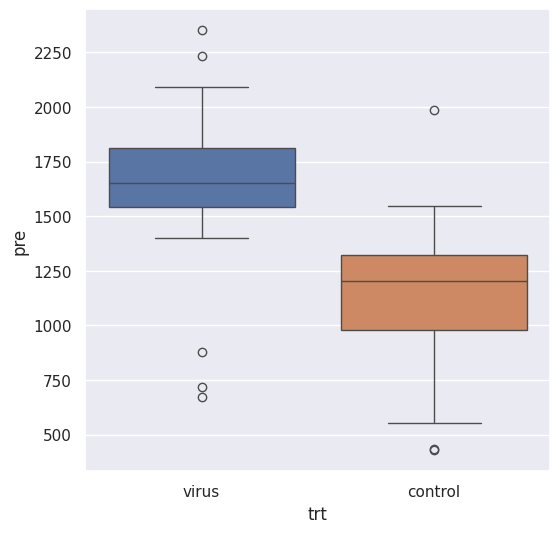

In [21]:
# scatter plot
plt.figure(figsize=(6, 6))
g = sns.boxplot(data=df_s2, hue="trt",
                x="trt", y="pre", width=.8)
plt.savefig("out/s2_boxplot.png", dpi=300,)

In [112]:
# datetime
# date: 2024-02-28
# time: 17:00
# datetime: 2024-02-28 17:00
import datetime
df_s2["datetime"] = pd.to_datetime(df_s2["date"] + " " + df_s2["time"])
df_merge_long = df_s2.loc[:, ["trt", "datetime", "obs", "pre"]].\
    melt(id_vars=["trt", "datetime"], var_name="type", value_name="count")
df_merge_long["datetime"] = pd.to_datetime(df_merge_long["datetime"])
df_merge_long

,trt,datetime,type,count
0,virus,2023-02-28 05:00:00,obs,1063.0
1,virus,2023-03-09 05:00:00,obs,386.0
2,virus,2023-03-10 17:00:00,obs,1163.0
3,virus,2023-03-11 05:00:00,obs,1188.0
4,virus,2023-03-12 17:00:00,obs,1176.0
...,...,...,...,...
103,control,2023-03-30 17:00:00,pre,1312.0
104,control,2023-03-04 05:00:00,pre,859.0
105,control,2023-03-06 17:00:00,pre,429.0
106,control,2023-03-07 05:00:00,pre,553.0


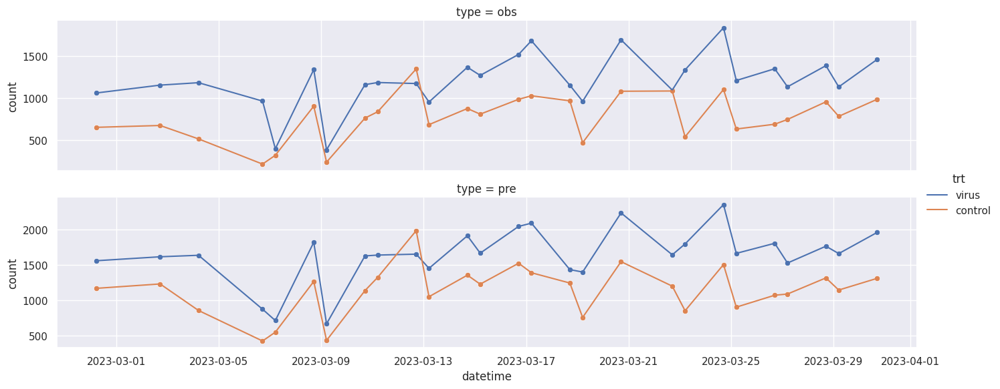

In [126]:
g = sns.FacetGrid(df_merge_long, row="type", hue="trt", sharey=False)
g.figure.set_size_inches(14, 6)
g.map_dataframe(sns.scatterplot, 
                x="datetime", y="count", 
                sizes=(50, 50),
                # hue="type", hue_order=["pre", "obs"],
                data=df_merge_long,)
g.map_dataframe(sns.lineplot, x="datetime", y="count", 
#                 style="type", style_order=["pre", "obs"],
                data=df_merge_long,
                # alpha=.5
)
g.add_legend()
plt.savefig("out/s2_timechanges.png", dpi=300)